<a href="https://colab.research.google.com/github/mylawacad/unimatch/blob/master/UniMatch_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p align="center">
  <h1 align="center">Unifying Flow, Stereo and Depth Estimation</h1>
  <p align="center">
    <a href="https://haofeixu.github.io/">Haofei Xu</a>
    ·
    <a href="https://scholar.google.com/citations?user=9jH5v74AAAAJ">Jing Zhang</a>
    ·
    <a href="https://jianfei-cai.github.io/">Jianfei Cai</a>
    ·
    <a href="https://scholar.google.com/citations?user=VxAuxMwAAAAJ">Hamid Rezatofighi</a>
    ·
    <a href="https://www.yf.io/">Fisher Yu</a>
    ·
    <a href="https://scholar.google.com/citations?user=RwlJNLcAAAAJ">Dacheng Tao</a>
    ·
    <a href="http://www.cvlibs.net/">Andreas Geiger</a>
  </p>
  <h3 align="center"><a href="https://arxiv.org/abs/2211.05783">Paper</a> | <a href="https://haofeixu.github.io/unimatch/">Project Page</a> | <a href="https://github.com/autonomousvision/unimatch">GitHub</a> </h3>
  <div align="center"></div>
</p>

<p align="center">
  <a href="">
    <img src="https://haofeixu.github.io/unimatch/resources/teaser.svg" alt="Logo" width="70%">
  </a>
</p>

<p align="center">
A unified model for three motion and 3D perception tasks.
</p>

Our code is able to run on both CPU and GPU, but a GPU is preferred for faster speed.

# Installation

In [ ]:
# get the code 
!git clone https://github.com/autonomousvision/unimatch

In [ ]:
%cd /content/unimatch

/content/unimatch


In [ ]:
# dependencies
!bash pip_install.sh

In [ ]:
# check env
import torch

print('PyTorch version: %s' % torch.__version__)

if not torch.cuda.is_available():
  print('Running on CPU')
else:
  print('Runing on GPU %s' % torch.cuda.get_device_name())

PyTorch version: 1.9.0+cu102
Runing on GPU Tesla T4


# Download Model

In [ ]:
# we assume the downloaded model weights are located under the pretrained directory.
%mkdir pretrained

In [ ]:
# we provide a large number of model weights with different speed-accuracy trade-off trained on different datasets for downloading: 
# https://github.com/autonomousvision/unimatch/blob/master/MODEL_ZOO.md
# download example weights for flow, stereo and depth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth
!wget -P pretrained https://s3.eu-central-1.amazonaws.com/avg-projects/unimatch/pretrained/gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth

In [ ]:
# check downloading
%ls pretrained

gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth
gmflow-scale2-regrefine6-kitti15-25b554d7.pth
gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth


# Demo

In [ ]:
# visualization utils
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display, HTML
from base64 import b64encode

plt.rcParams["figure.figsize"] = (30, 5)

def vis_img(img):
  plt.imshow(img)
  plt.axis("off")
  plt.show()

def vis_video(video_path):
  mp4 = open(video_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=600 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

## Optical Flow

In [ ]:
# inference on image dir
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmflow_demo.sh
!python main_flow.py \
--inference_dir demo/flow-davis \
--resume pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth \
--output_path output/gmflow-scale2-regrefine6-davis \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 6

Load checkpoint: pretrained/gmflow-scale2-regrefine6-mixdata-train320x576-4e7b215d.pth
3 images found
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
Done!


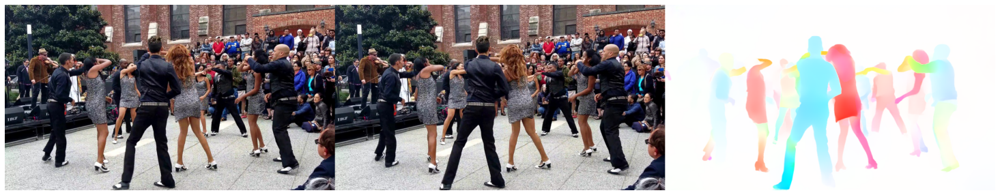

In [ ]:
# visualize image and flow
img0_path = 'demo/flow-davis/00000.jpg'
img1_path = 'demo/flow-davis/00001.jpg'
flow_path = 'output/gmflow-scale2-regrefine6-davis/00000_flow.png'

img0, img1, flow = plt.imread(img0_path), plt.imread(img1_path), plt.imread(flow_path)
vis_img(np.concatenate([img0 / 255., img1 / 255., flow], axis=1))

In [ ]:
# inference on video
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmflow_demo.sh
!python main_flow.py \
--inference_video demo/kitti.mp4 \
--resume pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth \
--output_path output/kitti \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 6 \
--save_video \
--concat_flow_img

Load checkpoint: pretrained/gmflow-scale2-regrefine6-kitti15-25b554d7.pth
video size (hxw): 384x1248
fps: 10
50 images found
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
Done!


In [ ]:
# visualize video
video_path = 'output/kitti/kitti_flow_img.mp4'
vis_video(video_path)

## Stereo Matching

In [ ]:
# inference on a stereo pair
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmstereo_demo.sh
!python main_stereo.py \
--inference_dir demo/stereo-middlebury \
--inference_size 1024 1536 \
--output_path output/gmstereo-scale2-regrefine3-middlebury \
--resume pretrained/gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth \
--padding_factor 32 \
--upsample_factor 4 \
--num_scales 2 \
--attn_type self_swin2d_cross_swin1d \
--attn_splits_list 2 8 \
--corr_radius_list -1 4 \
--prop_radius_list -1 1 \
--reg_refine \
--num_reg_refine 3

=> Load checkpoint: pretrained/gmstereo-scale2-regrefine3-resumeflowthings-middleburyfthighres-a82bec03.pth
1 test samples found
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
Done!


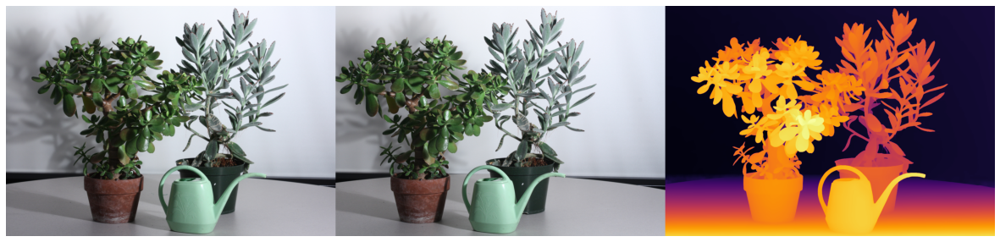

In [ ]:
# visualize image and disparity
img0_path = 'demo/stereo-middlebury/im0.png'
img1_path = 'demo/stereo-middlebury/im1.png'
disp_path = 'output/gmstereo-scale2-regrefine3-middlebury/im0_disp.png'

img0, img1, disp = plt.imread(img0_path), plt.imread(img1_path), plt.imread(disp_path)
vis_img(np.concatenate([img0, img1, disp], axis=1))

## Depth Estimation

In [ ]:
# inference on posed images
# script from: https://github.com/autonomousvision/unimatch/blob/master/scripts/gmdepth_demo.sh
!python main_depth.py \
--inference_dir demo/depth-scannet \
--output_path output/gmdepth-scale1-regrefine1-scannet \
--resume pretrained/gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth \
--reg_refine \
--num_reg_refine 1


=> Load checkpoint: pretrained/gmdepth-scale1-regrefine1-resumeflowthings-scannet-90325722.pth
=> Predicting 0/4
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
Done!


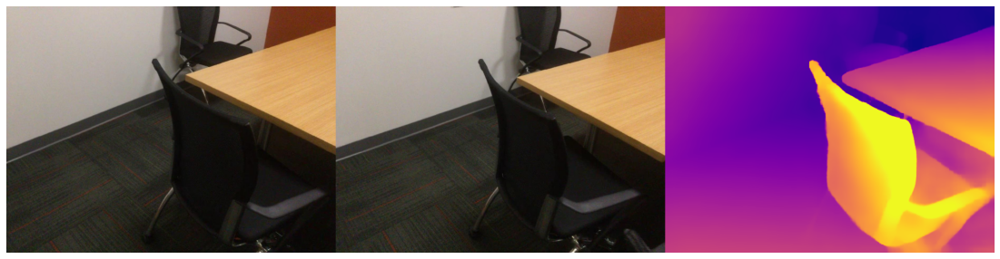

In [ ]:
# visualize image and depth
img0_path = 'demo/depth-scannet/color/0048.png'
img1_path = 'demo/depth-scannet/color/0054.png'
depth_path = 'output/gmdepth-scale1-regrefine1-scannet/0048.png'

img0, img1, depth = plt.imread(img0_path), plt.imread(img1_path), plt.imread(depth_path)
vis_img(np.concatenate([img0, img1, depth], axis=1))

That's it!